Zadanie 1

In [1]:
!pip install torch_geometric

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 616.2/616.2 kB 19.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.0-py3-none-any.whl size=909897 sha256=755e0fae85061420e7f8e5a9bf28b55cba1f58b22ceaa26dc7b437b198b362f0
  Stored in directory: /root/.cache/pip/wheels/cd/7d/6b/17150450b80b4a3656a84330e22709ccd8dc0f8f4773ba4133
Successfully built torch_geometric


In [2]:
# Funkcja do rysowania grafu oryginalnego
import networkx as nx

def draw_true_graph(G):
    pos = nx.spring_layout(G, seed=42)
    colors = ['#1f78b4' if data.y[i] == 0 else '#33a02c' for i in range(G.number_of_nodes())]
    plt.subplot(1, 2, 1)
    nx.draw(G, pos=pos, with_labels=True, node_color=colors, edgecolors='gray')
    plt.title('True Labels')

# Wyświetl predykcje
def draw_graph_predict(G, pred):
    pos = nx.spring_layout(G, seed=42)
    colors = ['#1f78b4' if p == 0 else '#33a02c' for p in pred]
    plt.subplot(1, 2, 2)
    nx.draw(G, pos=pos, with_labels=True, node_color=colors, edgecolors='gray')
    plt.title('Predicted Labels')
    plt.show()


Epoch 0: Train Loss: 1.4053, Train Accuracy: 0.0588, Val Loss: 1.4053


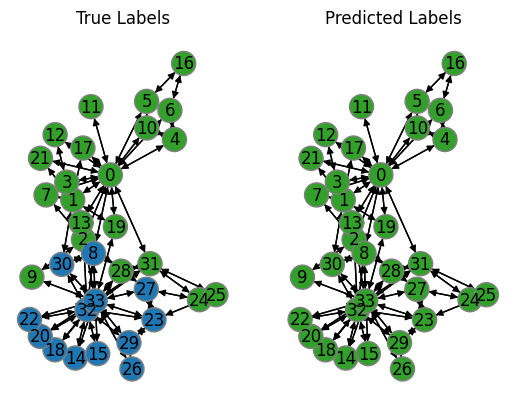

Epoch 1: Train Loss: 1.4009, Train Accuracy: 0.2941, Val Loss: 1.4009


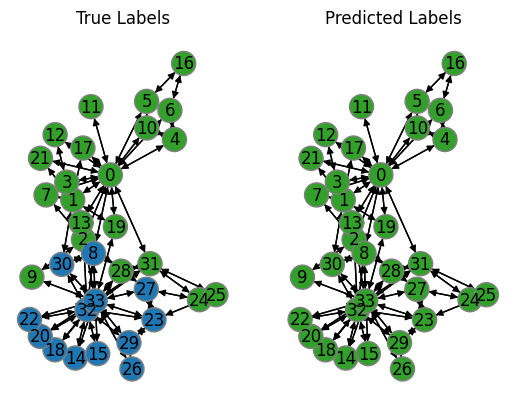

Epoch 2: Train Loss: 1.4022, Train Accuracy: 0.5294, Val Loss: 1.4022


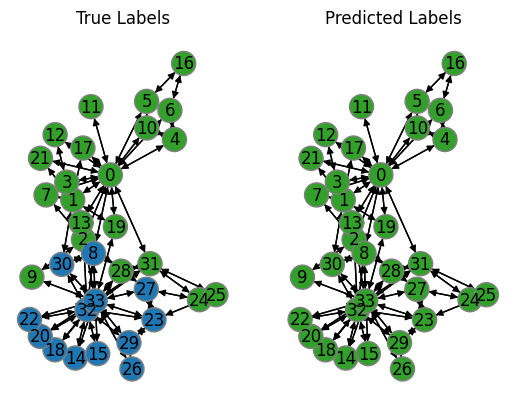

Epoch 3: Train Loss: 1.4052, Train Accuracy: 0.5882, Val Loss: 1.4052


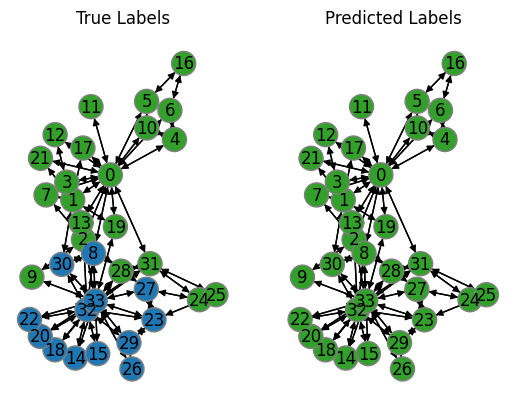

Epoch 4: Train Loss: 1.3973, Train Accuracy: 0.5882, Val Loss: 1.3973


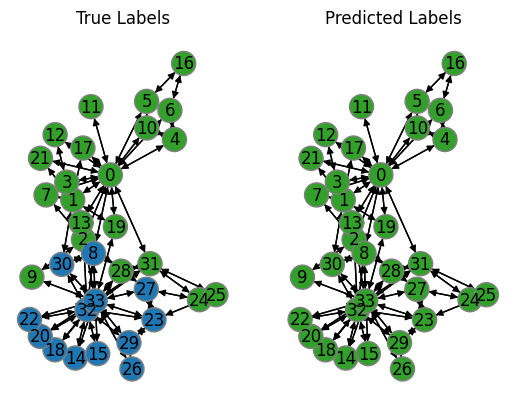

Epoch 5: Train Loss: 1.4028, Train Accuracy: 0.5882, Val Loss: 1.4028


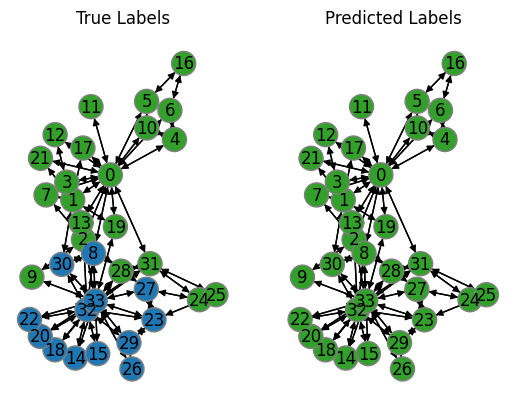

Epoch 6: Train Loss: 1.4061, Train Accuracy: 0.5882, Val Loss: 1.4061


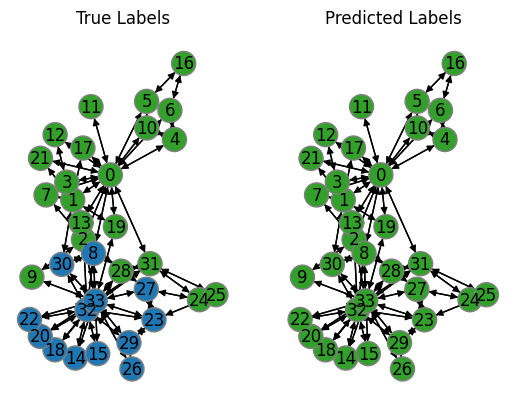

Epoch 7: Train Loss: 1.3953, Train Accuracy: 0.5882, Val Loss: 1.3953


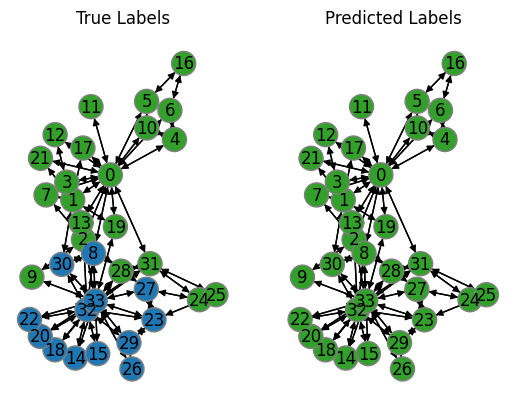

Epoch 8: Train Loss: 1.4081, Train Accuracy: 0.5882, Val Loss: 1.4081


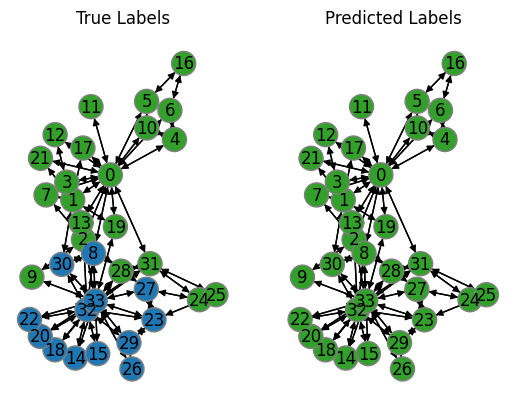

Epoch 9: Train Loss: 1.4046, Train Accuracy: 0.5882, Val Loss: 1.4046


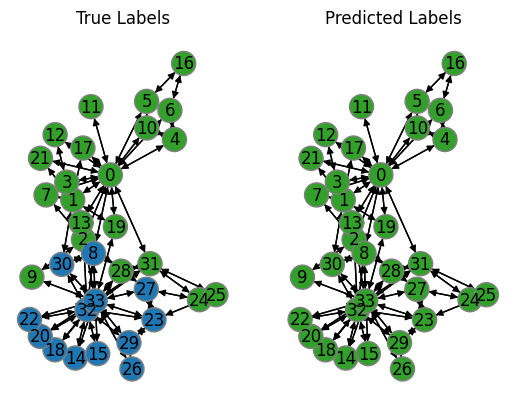

Epoch 10: Train Loss: 1.4059, Train Accuracy: 0.5882, Val Loss: 1.4059


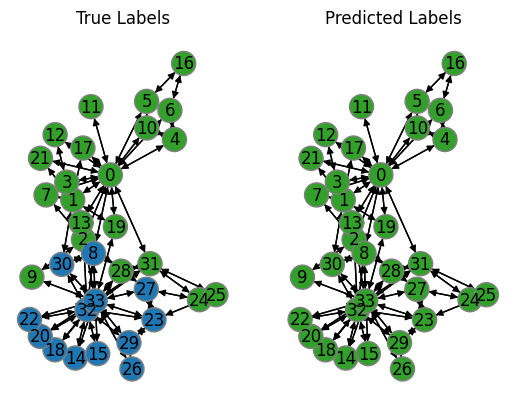

Epoch 11: Train Loss: 1.3973, Train Accuracy: 0.5882, Val Loss: 1.3973


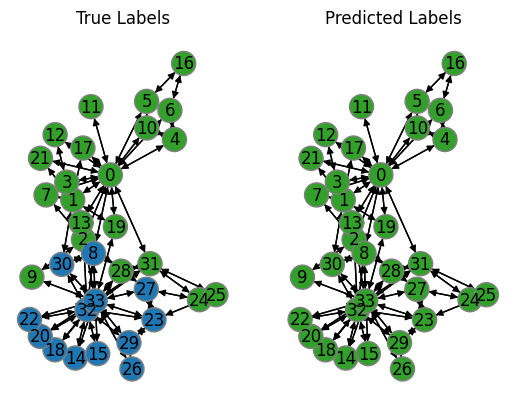

Epoch 12: Train Loss: 1.4172, Train Accuracy: 0.5882, Val Loss: 1.4172


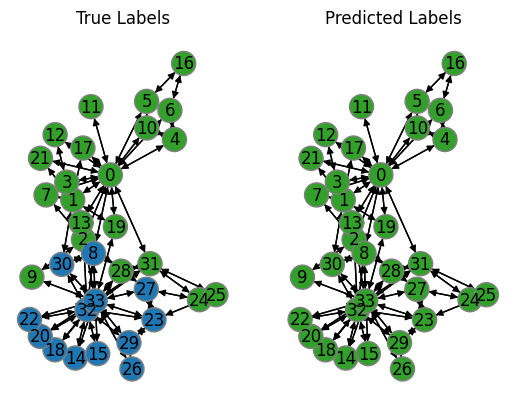

Epoch 13: Train Loss: 1.4190, Train Accuracy: 0.5882, Val Loss: 1.4190


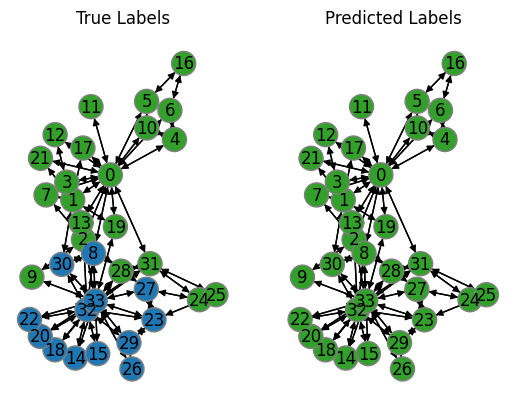

Epoch 14: Train Loss: 1.4074, Train Accuracy: 0.5882, Val Loss: 1.4074


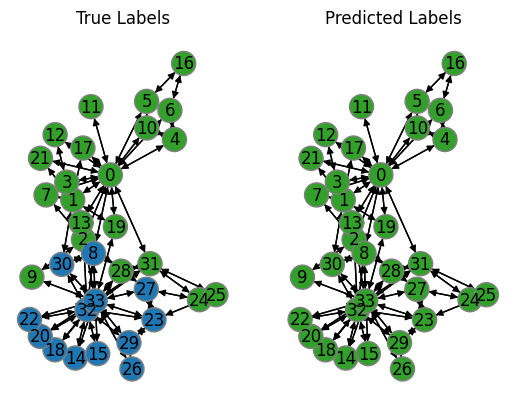

Epoch 15: Train Loss: 1.4008, Train Accuracy: 0.5882, Val Loss: 1.4008


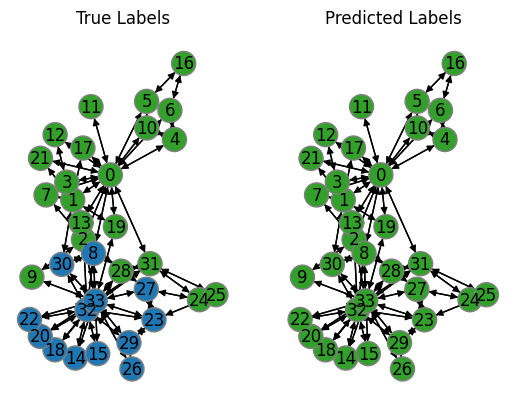

Epoch 16: Train Loss: 1.4007, Train Accuracy: 0.5882, Val Loss: 1.4007


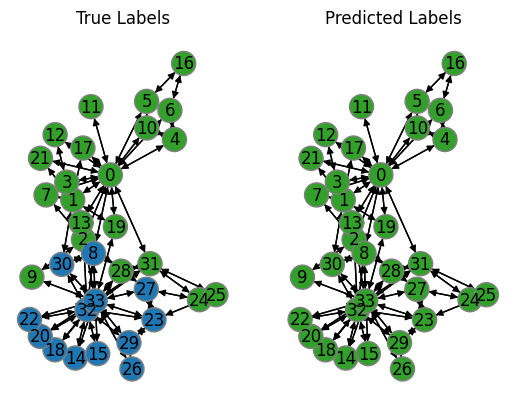

Early stopping: no improvement after 10 epochs.
Final Training Accuracy: 0.5882
Predicted Class Labels: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1])


In [16]:
import torch
import torch.nn.functional as F
from torch_geometric.datasets import KarateClub
from torch_geometric.nn import GCNConv
from torch_geometric.data import DataLoader
from torch.optim import AdamW

# Załaduj zbiór danych Karate Club
dataset = KarateClub()

# Wczytaj pierwszy graf z zestawu danych
data = dataset[0]

# Wyznacz losowo 10 węzłów uczących się
import random
n = data.num_nodes
train_mask = torch.zeros(n, dtype=torch.bool)
val_mask = torch.zeros(n, dtype=torch.bool)
test_mask = torch.zeros(n, dtype=torch.bool)
train_mask[:n//2] = 1
val_mask[n//2:3*n//4] = 1
test_mask[3*n//4:] = 1
data.train_mask = train_mask
data.val_mask = val_mask
data.test_mask = test_mask

# # Zdefiniuj model GNN
# class Net(torch.nn.Module):
#     def __init__(self):
#         super(Net, self).__init__()
#         self.conv1 = GCNConv(dataset.num_features, 16)
#         self.conv2 = GCNConv(16, dataset.num_classes)

#     def forward(self, x, edge_index):
#         x = self.conv1(x, edge_index)  # pierwsza warstwa konwolucyjna na wejściu x i krawędziach edge_index
#         x = F.relu(x)  # nieliniowa funkcja aktywacji - ReLU
#         x = F.dropout(x, training=self.training)  # regularyzacja - dropout
#         x = self.conv2(x, edge_index)  # druga warstwa konwolucyjna na wyjściu z poprzedniej warstwy i krawędziach edge_index
#         return F.log_softmax(x, dim=1)  # funkcja softmax zwracająca prawdopodobieństwa przynależności do klas, zwracana wartość jest zlogarytmowana (log_softmax)

# Zdefiniuj model GNN
class Net(torch.nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = GCNConv(dataset.num_features, 16)
        self.conv2 = GCNConv(16, 32)
        self.conv3 = GCNConv(32, dataset.num_classes)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, training=self.training)
        x = self.conv3(x, edge_index)
        return F.log_softmax(x, dim=1)


# Zainicjuj model i funkcję kosztu
model = Net()
#criterion = torch.nn.NLLLoss()
criterion = torch.nn.CrossEntropyLoss()
optimizer = AdamW(model.parameters(), lr=0.001)


# model = Net()
# criterion = torch.nn.NLLLoss()
# optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

import matplotlib.pyplot as plt
from torch_geometric.utils import to_networkx

# Konwertuj dane na graf
G = to_networkx(data)

best_val_loss = float('inf')
best_model = None
patience = 10
counter = 0

from torch_geometric.utils.convert import to_networkx

# Pętla ucząca z wyświetlaniem klasyfikacji za każdą epoką
for epoch in range(30):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = criterion(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    model.eval()
    val_loss = criterion(out[data.val_mask], data.y[data.val_mask])
    if val_loss < best_val_loss:
      best_val_loss = val_loss
      best_model = model.state_dict()
      counter = 0
    else:
      counter += 1
      if counter >= patience:
        print(f"Early stopping: no improvement after {patience} epochs.")
        break
    pred = model(data.x, data.edge_index).argmax(dim=1)
    train_acc = (pred[data.train_mask] == data.y[data.train_mask]).float().mean()
    val_acc = (pred[data.val_mask] == data.y[data.val_mask]).float().mean()
    print(f"Epoch {epoch}: Train Loss: {val_loss:.4f}, Train Accuracy: {train_acc:.4f}, Val Loss: {val_loss:.4f}")  #, Val Accuracy: {acc:.4f}", )
    
    draw_true_graph(to_networkx(data))
    draw_graph_predict(to_networkx(data), pred)


# Ustaw model w tryb ewaluacji i wyświetl wyniki
model.eval()
pred = model(data.x, data.edge_index).argmax(dim=1)
acc = (pred[data.train_mask] == data.y[data.train_mask]).float().mean()
print(f'Final Training Accuracy: {acc:.4f}')

# Wyświetl wyniki klasyfikacji dla wszystkich węzłów
pred = model(data.x, data.edge_index).argmax(dim=1)
print(f'Predicted Class Labels: {pred}')


# Zadanie 2 Texas Dataset (WebKG)

In [17]:
import matplotlib.pyplot as plt
import networkx as nx

def draw_true_graph_texas(G):
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, seed=42)
    nx.draw_networkx_nodes(G, pos, node_color=data.y, cmap='Set1', node_size=500)
    nx.draw_networkx_edges(G, pos)
    plt.title("True Graph")
    plt.show()

def draw_graph_predict_texas(G, pred):
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, seed=42)
    nx.draw_networkx_nodes(G, pos, node_color=pred, cmap='Set1', node_size=500)
    nx.draw_networkx_edges(G, pos)
    plt.title("Predicted Graph")
    plt.show()


In [ ]:
import torch
import torch.nn.functional as F
from torch_geometric.datasets import WebKB
from torch_geometric.nn import GCNConv
from torch_geometric.data import DataLoader
from torch.utils.data import Subset

# Load the WebKB dataset
dataset = WebKB(root='.', name='texas')

# Load the first graph from the dataset
data = dataset[0]

# Randomly select 10 nodes as training nodes
import random
train_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
train_mask[random.sample(range(data.num_nodes), 10)] = 1


# Use the remaining nodes for validation
val_mask = ~train_mask

# Define the subsets for training and validation

#train_data = dataset[Subset(range(data.num_nodes), train_mask)]
#val_data = dataset[Subset(range(data.num_nodes), val_mask)]

# Define the GNN model
class Net(torch.nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = GCNConv(data.num_node_features, 16)
        self.conv2 = GCNConv(16, data.num_classes)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Initialize the model and loss function
model = Net()
criterion = torch.nn.NLLLoss()

# Define the optimizer and train for 200 epochs
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)

# Define early stopping parameters
best_val_acc = 0.0
patience = 10
counter = 0

import matplotlib.pyplot as plt
from torch_geometric.utils import to_networkx

# Convert the data to a networkx graph
G = to_networkx(data)

# Training loop with classification output for each epoch
for epoch in range(30):
    print(f"---------------------------- EPOCH: {epoch}---------------------------------------")
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = criterion(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    model.eval()
    pred = model(data.x, data.edge_index).argmax(dim=1)
    acc = (pred[data.train_mask] == data.y[data.train_mask]).float().mean()
    print(f'Epoch {epoch}: Train Accuracy: {acc:.4f}')

    # Draw the true graph and the predicted graph
    draw_true_graph_texas(to_networkx(data))
    draw_graph_predict_texas(to_networkx(data), pred)

    print("-------------------------------------------------------------------")

# Set the model to evaluation mode and display the results
model.eval()
pred = model(data.x, data.edge_index).argmax(dim=1)
acc = (pred[data.train_mask] == data.y[data.train_mask]).float().mean()
print(f'Final Training Accuracy: {acc:.4f}')

# Display the classification results for all nodes
pred = model(data.x, data.edge_index).argmax(dim=1)
print(f'Predicted Class Labels: {pred}')

# Zadanie 2 Cora Dataset

In [ ]:
import torch
import torch.nn.functional as functional
from torch_geometric.nn import GCNConv
from torch_geometric.data import DataLoader
import random

from torch_geometric.datasets import Planetoid
import matplotlib.pyplot as plt
import networkx as nx

# Load the Cora dataset
cora_dataset = Planetoid(root='/tmp/Cora', name='Cora')
cora_data = cora_dataset[0]

# Initialize training mask
cora_data.train_mask = torch.zeros(cora_data.num_nodes, dtype=torch.bool)
cora_data.train_mask[random.sample(range(cora_data.num_nodes), 100)] = 1

# Function to draw the true graph
def visualize_true_graph(graph):
    plt.figure(figsize=(12, 8))
    positions = nx.spring_layout(graph, seed=42)
    nx.draw_networkx_nodes(graph, positions, node_color=cora_data.y, cmap='Set1', node_size=500)
    nx.draw_networkx_edges(graph, positions)
    plt.title("True Graph Representation")
    plt.show()

# Function to draw the graph with predictions
def visualize_predicted_graph(graph, predictions):
    plt.figure(figsize=(12, 8))
    positions = nx.spring_layout(graph, seed=42)
    nx.draw_networkx_nodes(graph, positions, node_color=predictions, cmap='Set1', node_size=500)
    nx.draw_networkx_edges(graph, positions)
    plt.title("Predicted Graph Representation")
    plt.show()

# Define the GNN model class
class GNNModel(torch.nn.Module):
    def __init__(self):
        super(GNNModel, self).__init__()
        self.layer1 = GCNConv(cora_dataset.num_features, 64)
        self.layer2 = GCNConv(64, cora_dataset.num_classes)

    def forward(self, node_features, edge_indices):
        node_features = self.layer1(node_features, edge_indices)
        node_features = functional.relu(node_features)
        node_features = functional.dropout(node_features, training=self.training)
        node_features = self.layer2(node_features, edge_indices)
        return functional.log_softmax(node_features, dim=1)

# Initialize model and loss function
gnn = GNNModel()
loss_function = torch.nn.NLLLoss()

# Define optimizer and train for specified epochs
optimizer = torch.optim.Adam(gnn.parameters(), lr=0.1)

# Convert data to graph format for visualization
cora_graph = nx.to_networkx(cora_data)

# Training loop
for epoch in range(30):
    gnn.train()
    optimizer.zero_grad()
    output = gnn(cora_data.x, cora_data.edge_index)
    loss = loss_function(output[cora_data.train_mask], cora_data.y[cora_data.train_mask])
    loss.backward()
    optimizer.step()
    gnn.eval()
    predictions = gnn(cora_data.x, cora_data.edge_index).argmax(dim=1)
    accuracy = (predictions[cora_data.train_mask] == cora_data.y[cora_data.train_mask]).float().mean()
    print(f'Epoch {epoch}: Train Accuracy: {accuracy:.4f}')

# Set the model to evaluation mode and display final results
gnn.eval()
final_predictions = gnn(cora_data.x, cora_data.edge_index).argmax(dim=1)
final_accuracy = (final_predictions[cora_data.train_mask] == cora_data.y[cora_data.train_mask]).float().mean()
print(f'Final Training Accuracy: {final_accuracy:.4f}')

# Display classification results for all nodes
print(f'Predicted Class Labels: {final_predictions}')


Zadanie 3

In [34]:
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import networkx as nx

def visualize_graph_classification(graph, true_label, predicted_label):
    G = nx.Graph()
    G.add_nodes_from(range(graph.num_nodes))
    G.add_edges_from(graph.edge_index.t().tolist())

    node_colors = []
    if len(true_label) == graph.num_nodes:
        for i in range(graph.num_nodes):
            if true_label[i] == 1:
                node_colors.append('red')
            else:
                node_colors.append('blue')
    else:
        node_colors = ['blue'] * graph.num_nodes

    pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, node_color=node_colors)
    plt.title(f"Predicted label: {predicted_label}")
    plt.show()




Dataset: MUTAG(188):
Number of graphs: 188
Number of features: 7
Number of classes: 2

Data(edge_index=[2, 38], x=[17, 7], edge_attr=[38, 4], y=[1])
Number of nodes: 17
Number of edges: 38
Average node degree: 2.24
Has isolated nodes: False
Has self-loops: False
Is undirected: True
Number of training graphs: 150
Number of test graphs: 38
GCN(
  (conv1): GCNConv(7, 64)
  (conv2): GCNConv(64, 64)
  (conv3): GCNConv(64, 64)
  (conv4): GCNConv(64, 64)
  (conv5): GCNConv(64, 64)
  (lin): Linear(in_features=64, out_features=2, bias=True)
)
------------------------------ START 1------------------------------


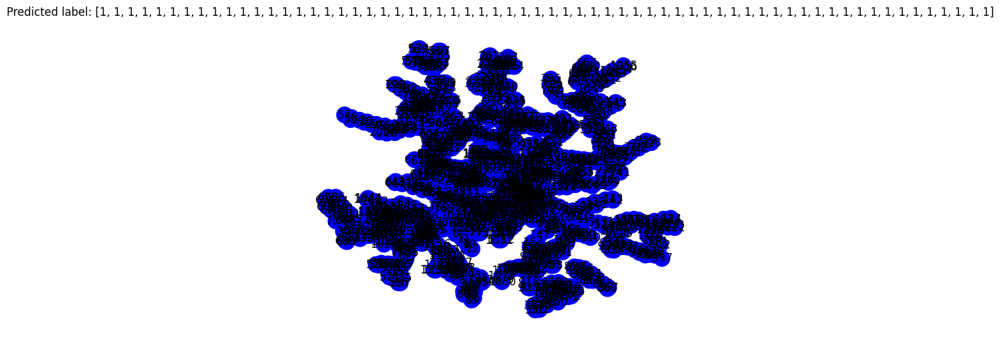

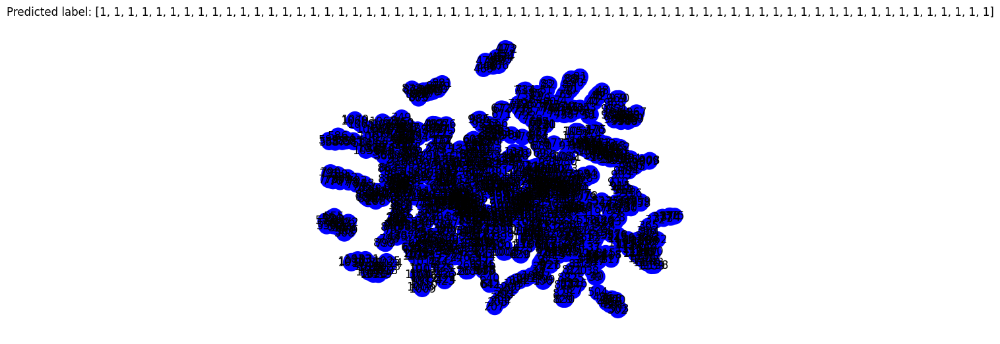

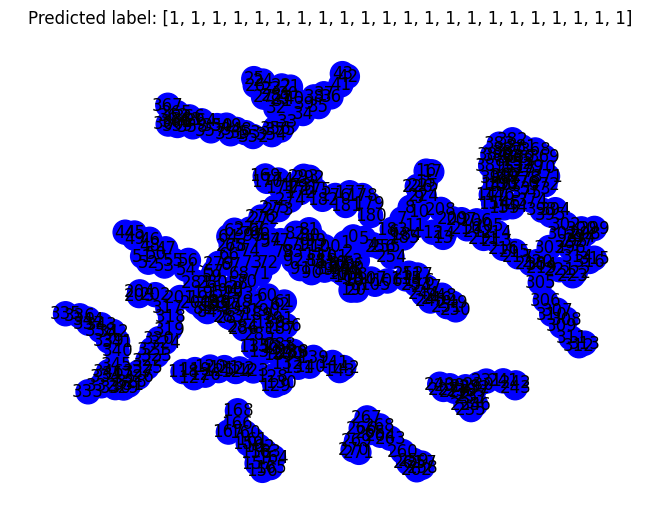

Epoch: 001, Train Acc: 0.6467, Test Acc: 0.7368
------------------------------ END 1------------------------------
------------------------------ START 2------------------------------


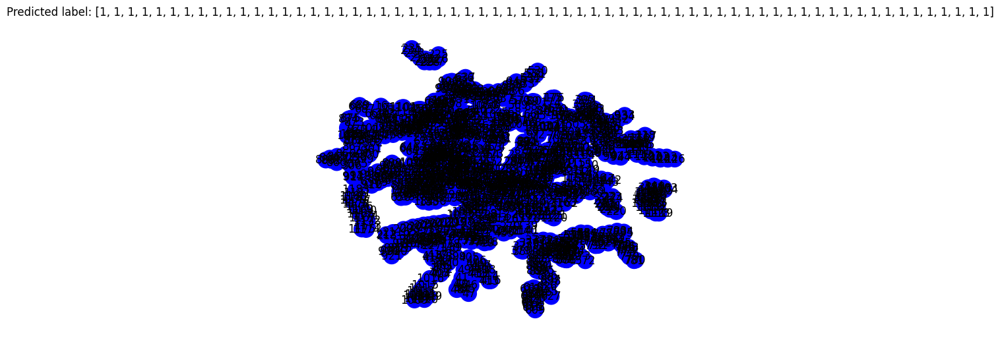

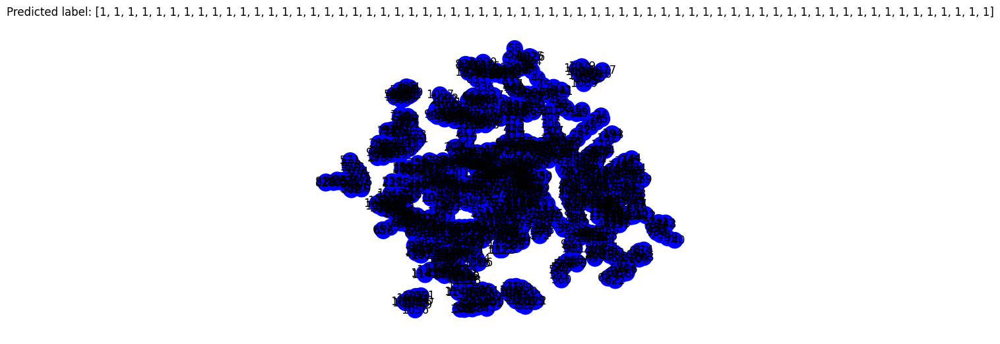

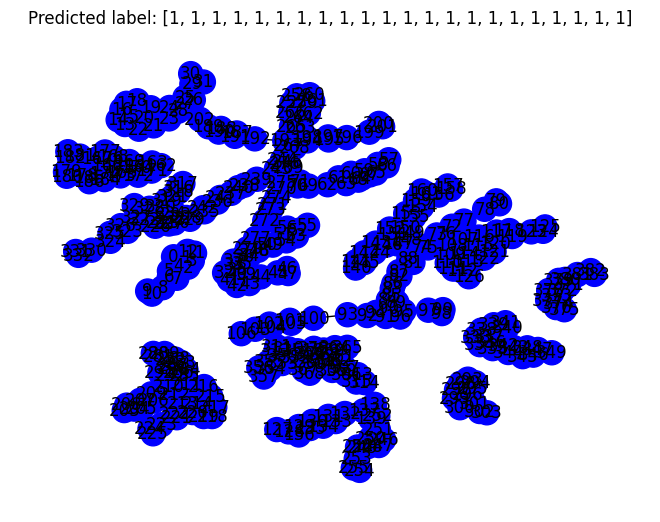

Epoch: 002, Train Acc: 0.6467, Test Acc: 0.7368
------------------------------ END 2------------------------------
------------------------------ START 3------------------------------


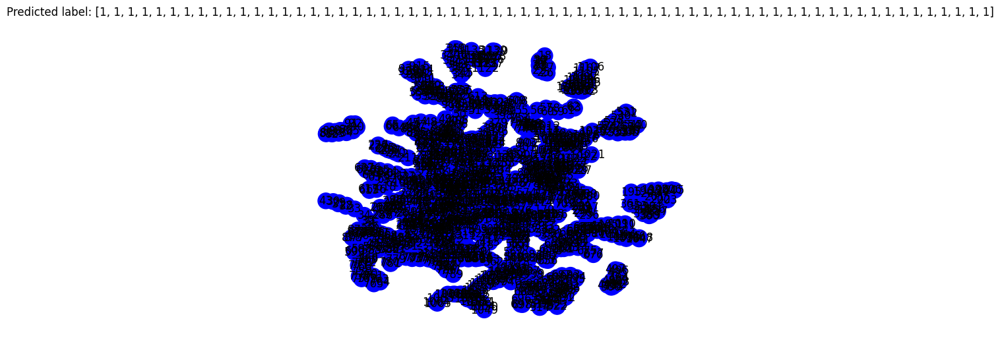

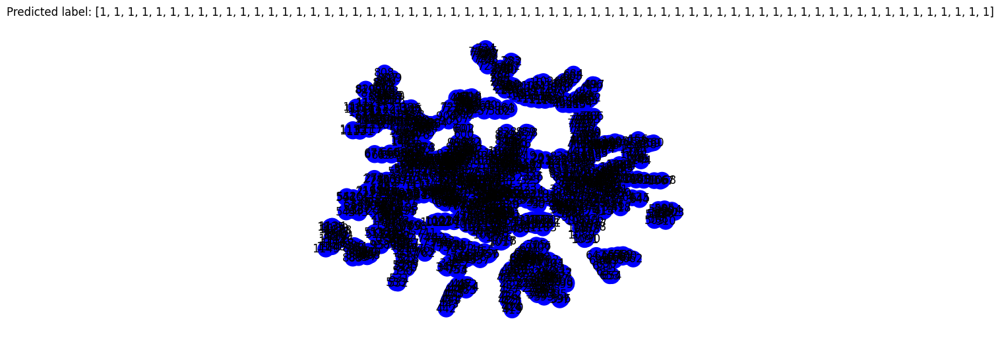

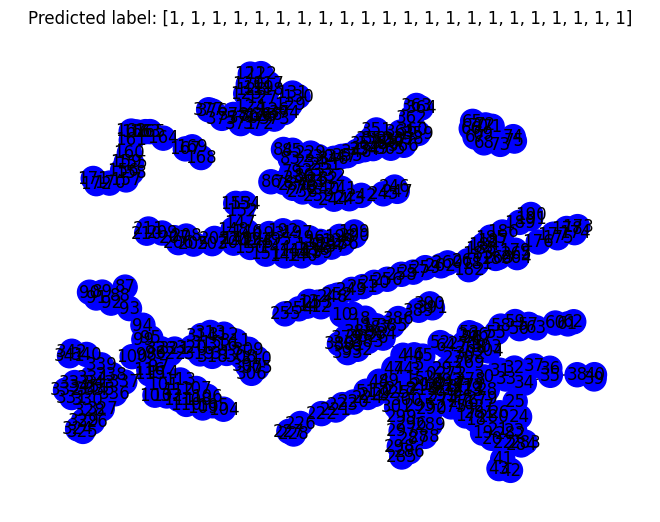

Epoch: 003, Train Acc: 0.6467, Test Acc: 0.7368
------------------------------ END 3------------------------------
------------------------------ START 4------------------------------


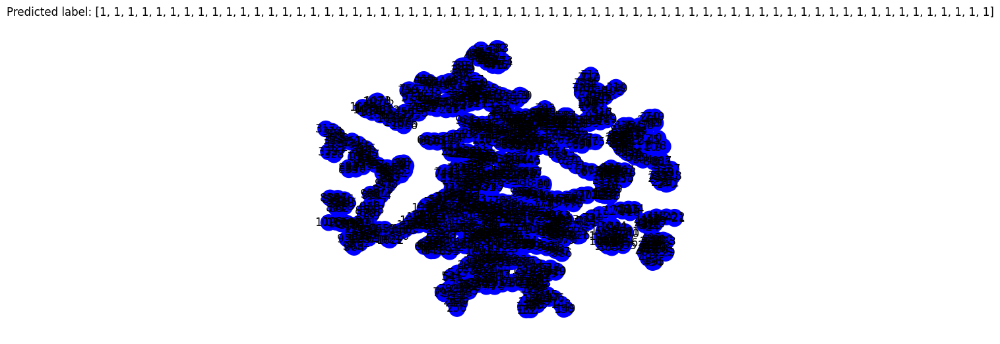

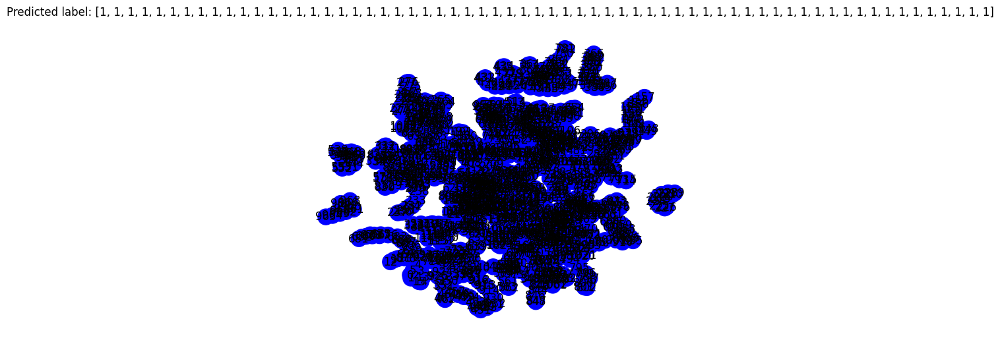

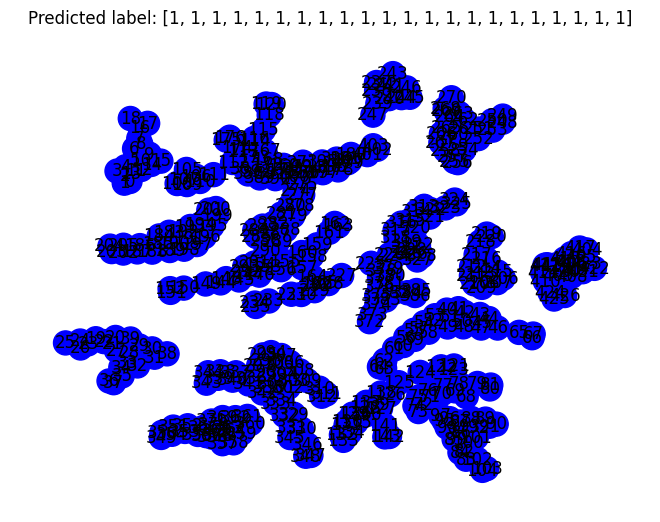

Epoch: 004, Train Acc: 0.6467, Test Acc: 0.7368
------------------------------ END 4------------------------------
------------------------------ START 5------------------------------


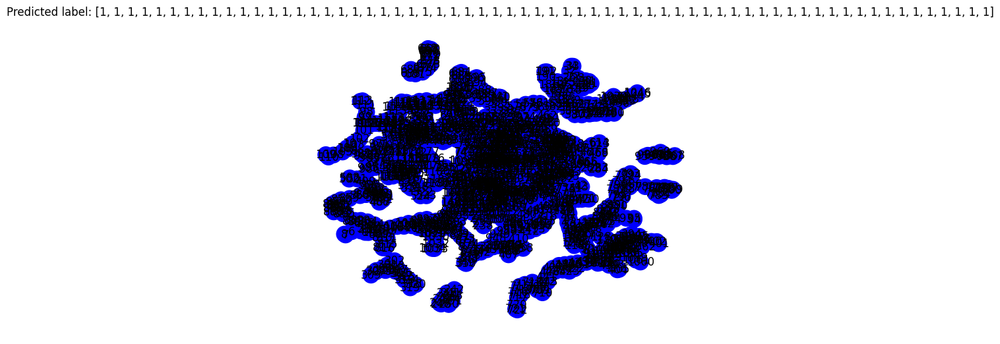

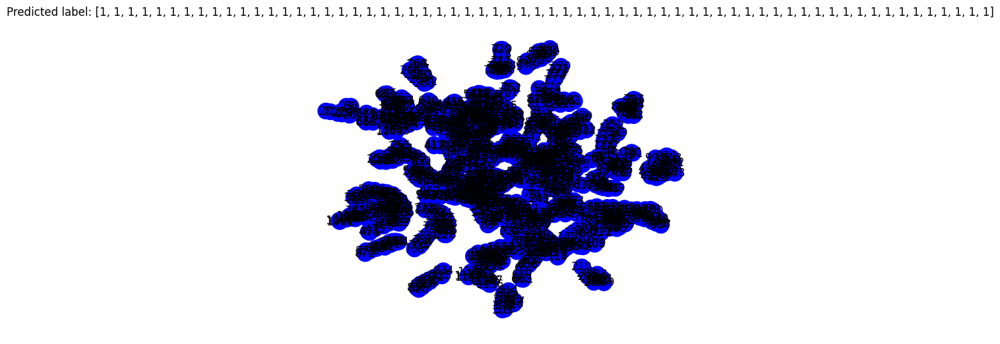

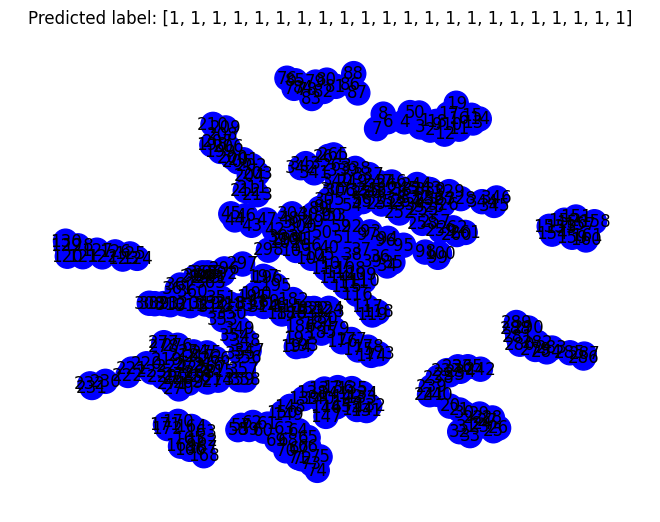

Epoch: 005, Train Acc: 0.6467, Test Acc: 0.7368
------------------------------ END 5------------------------------
------------------------------ START 6------------------------------


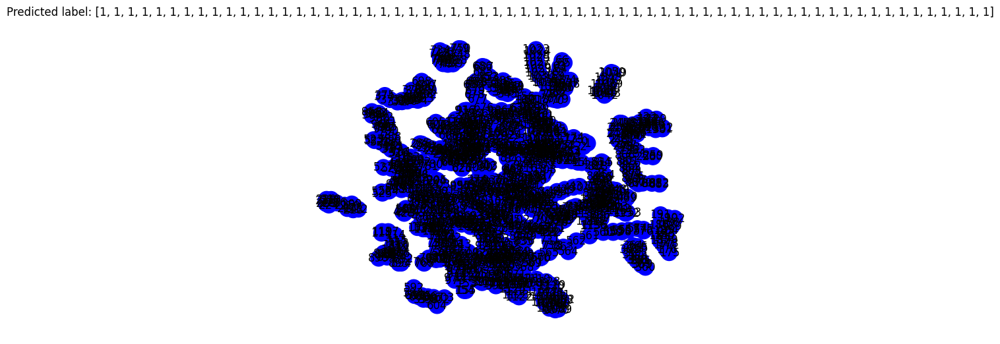

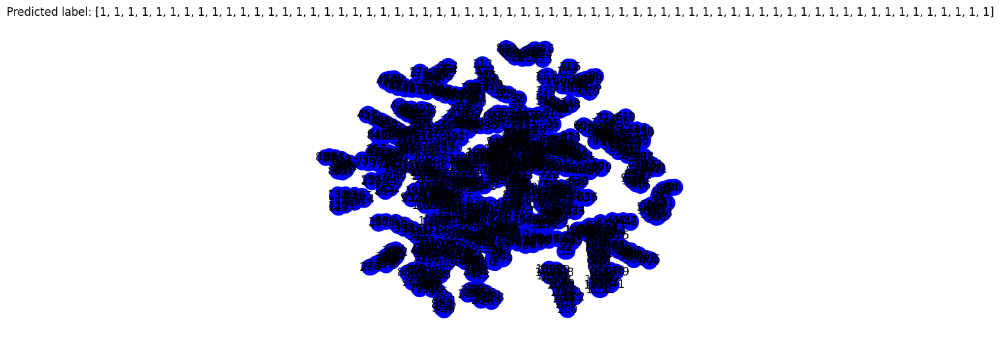

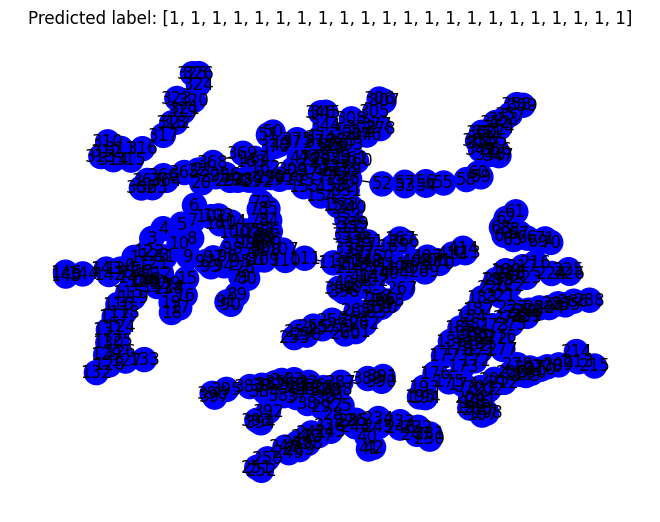

Epoch: 006, Train Acc: 0.6467, Test Acc: 0.7368
------------------------------ END 6------------------------------
------------------------------ START 7------------------------------


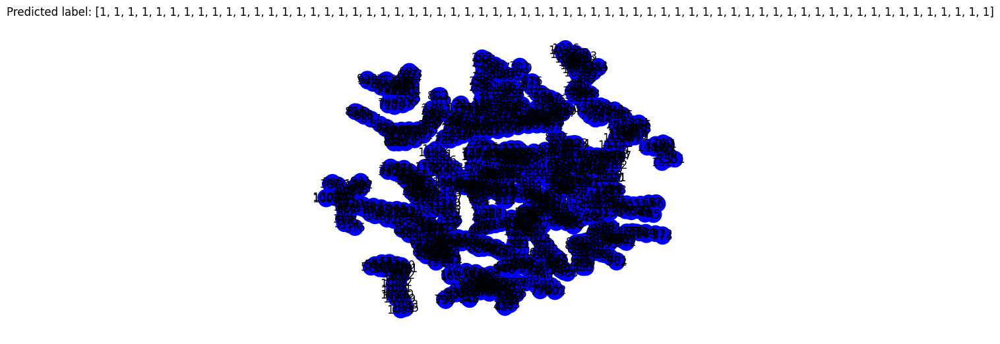

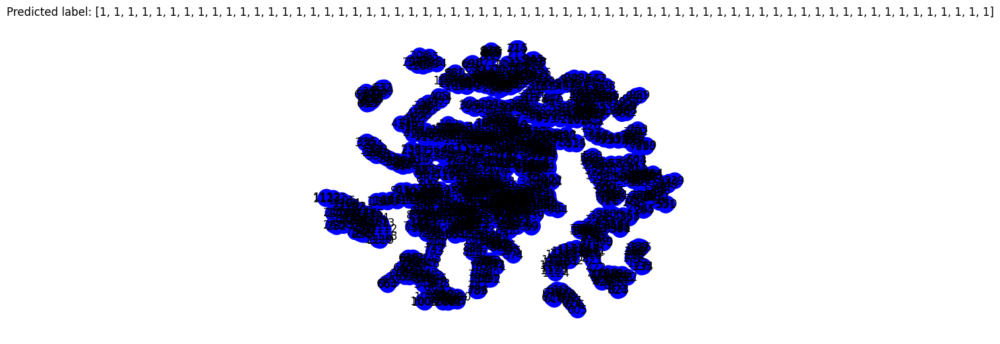

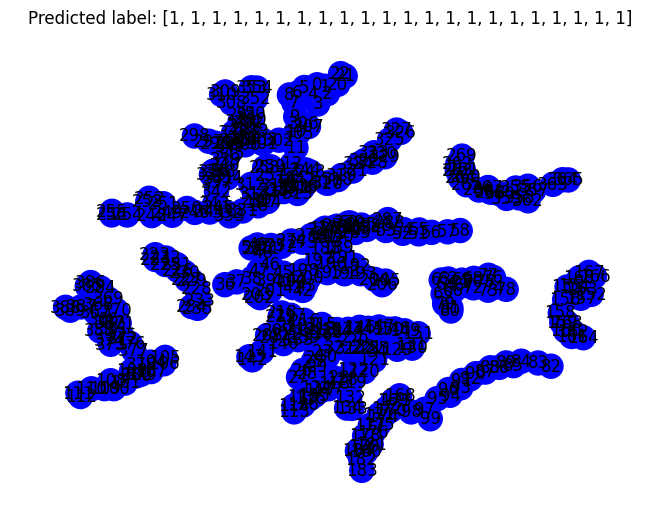

Epoch: 007, Train Acc: 0.6467, Test Acc: 0.7368
------------------------------ END 7------------------------------
------------------------------ START 8------------------------------


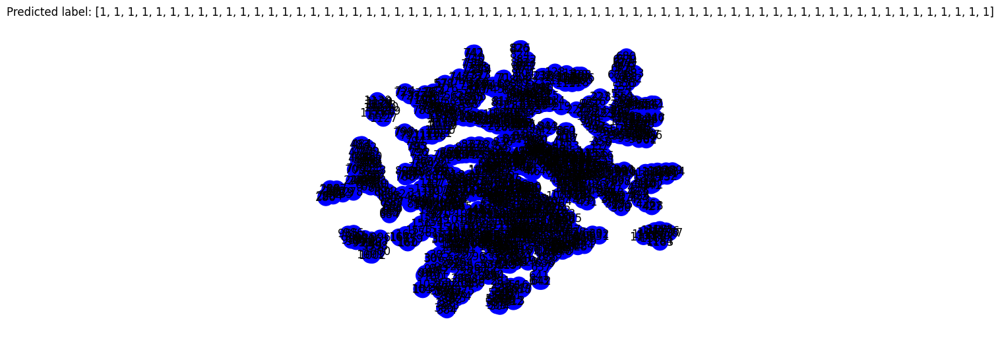

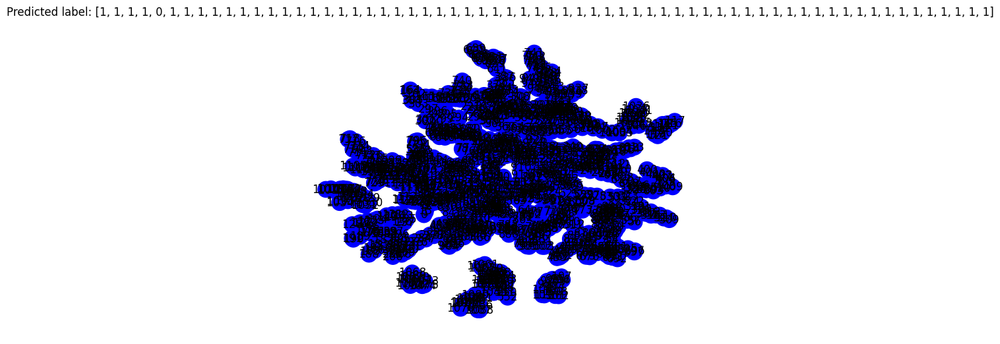

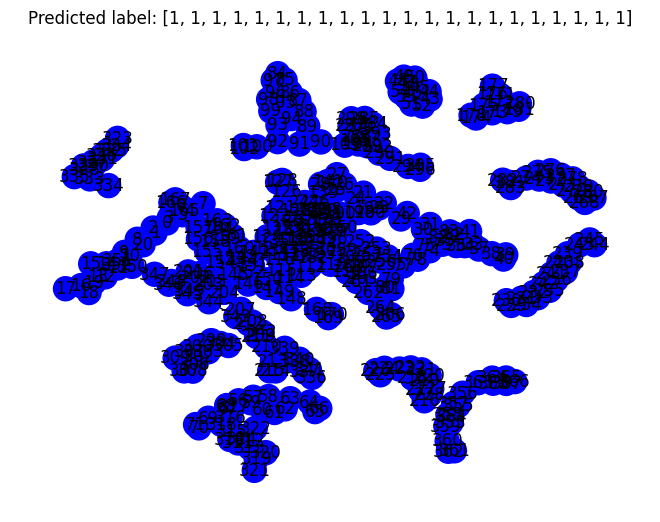

Epoch: 008, Train Acc: 0.6533, Test Acc: 0.7368
------------------------------ END 8------------------------------
------------------------------ START 9------------------------------


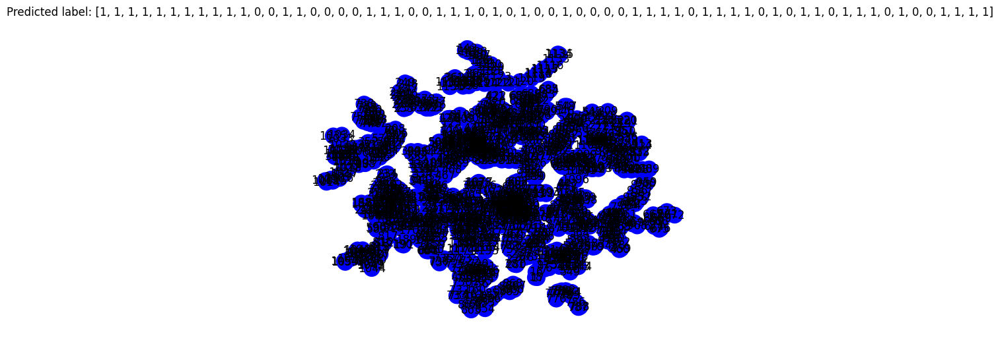

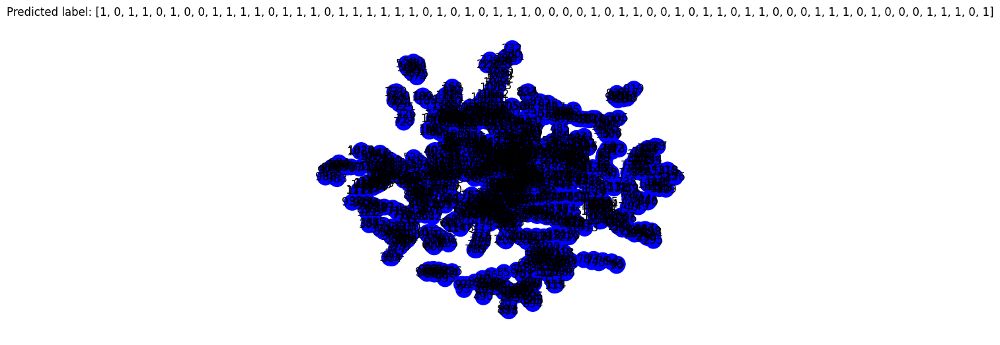

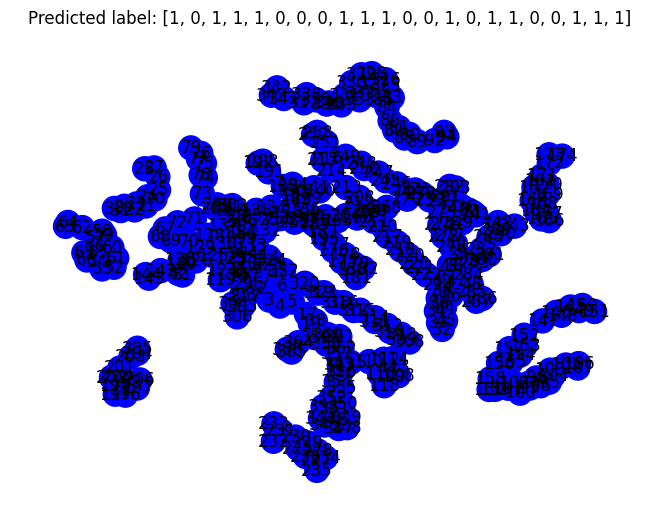

Epoch: 009, Train Acc: 0.7400, Test Acc: 0.8421
------------------------------ END 9------------------------------
------------------------------ START 10------------------------------


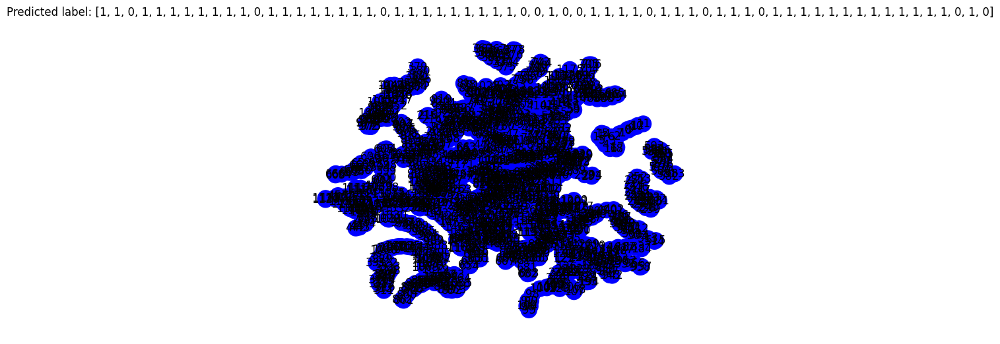

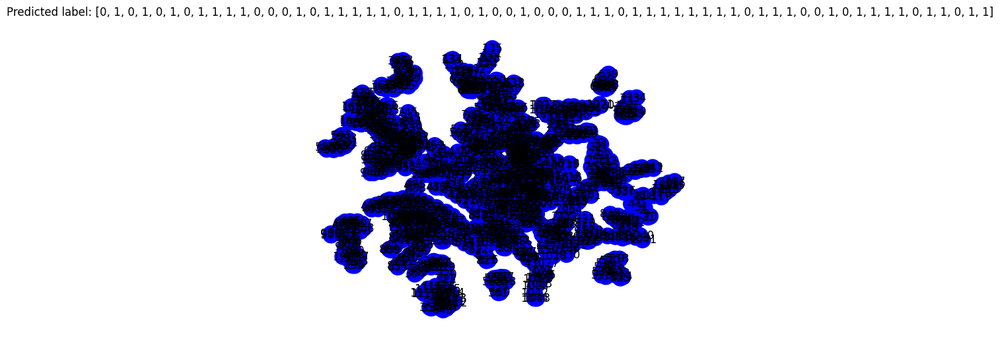

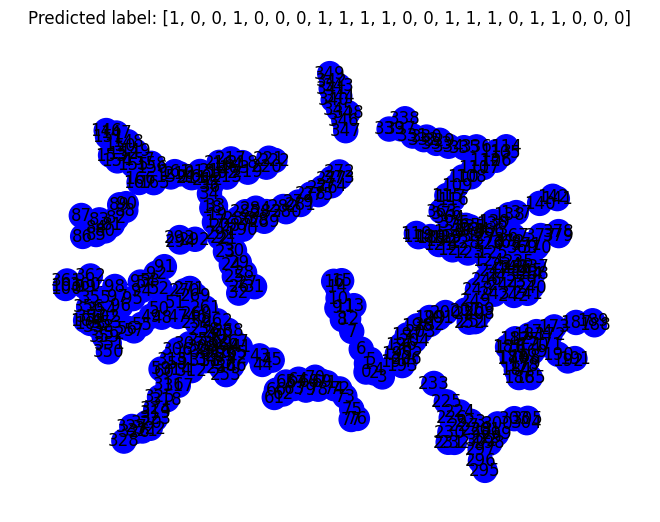

Epoch: 010, Train Acc: 0.7467, Test Acc: 0.7632
------------------------------ END 10------------------------------
------------------------------ START 11------------------------------


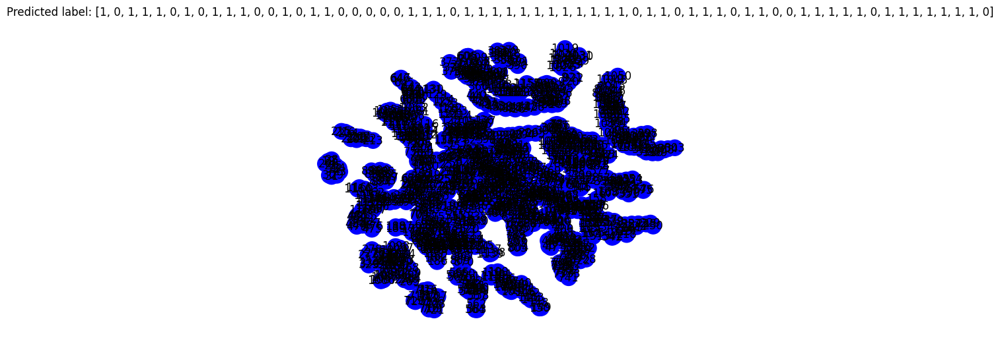

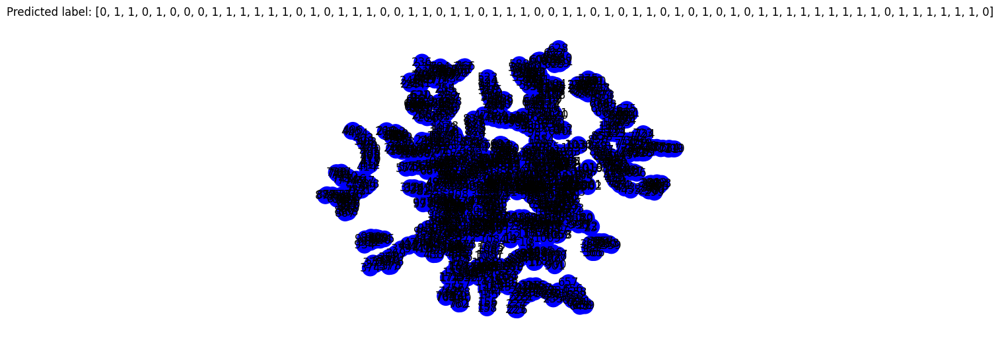

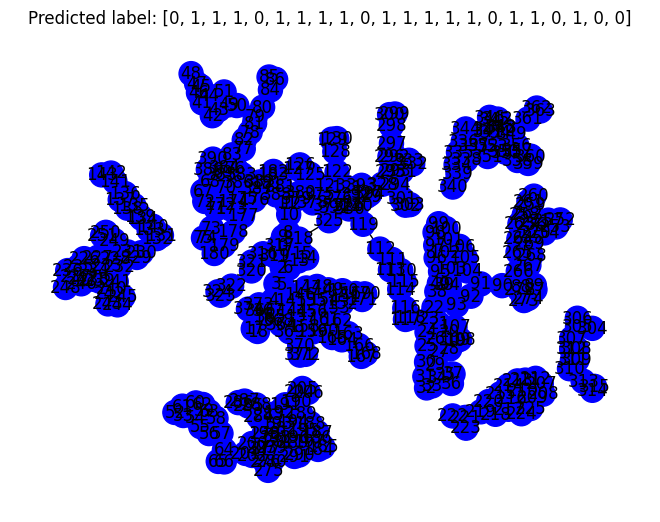

Epoch: 011, Train Acc: 0.7333, Test Acc: 0.7632
------------------------------ END 11------------------------------
------------------------------ START 12------------------------------


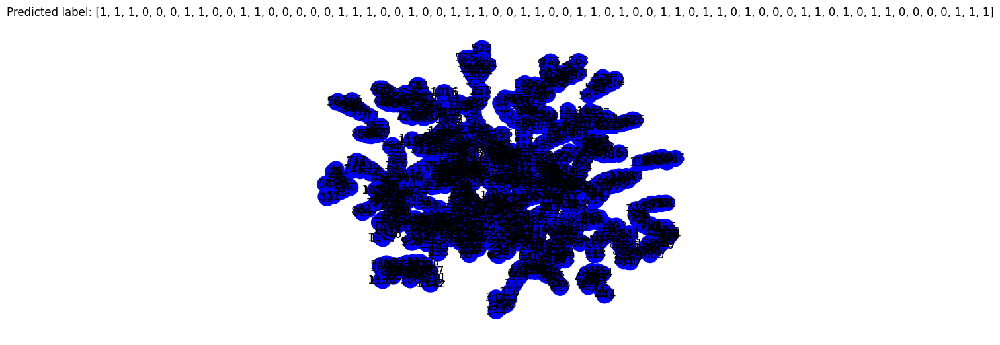

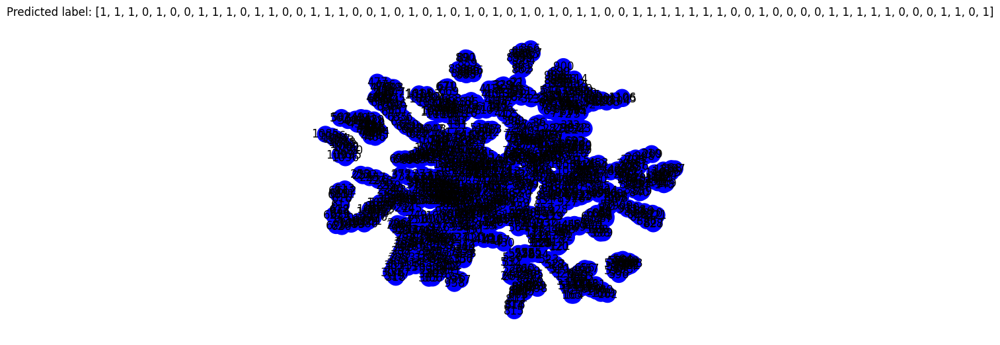

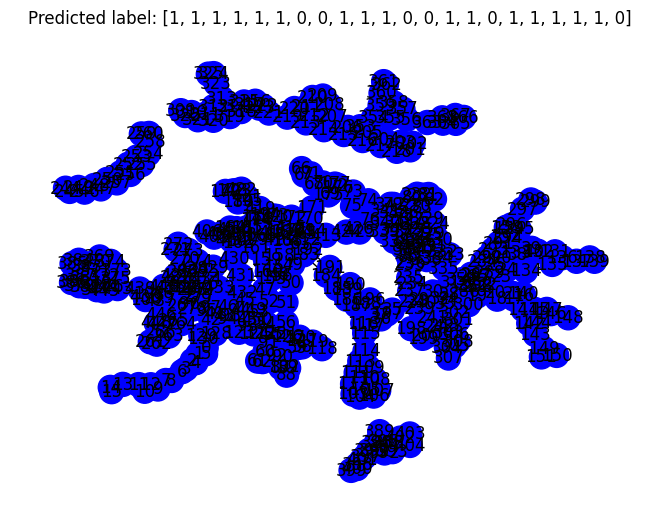

Epoch: 012, Train Acc: 0.7200, Test Acc: 0.7632
------------------------------ END 12------------------------------
------------------------------ START 13------------------------------


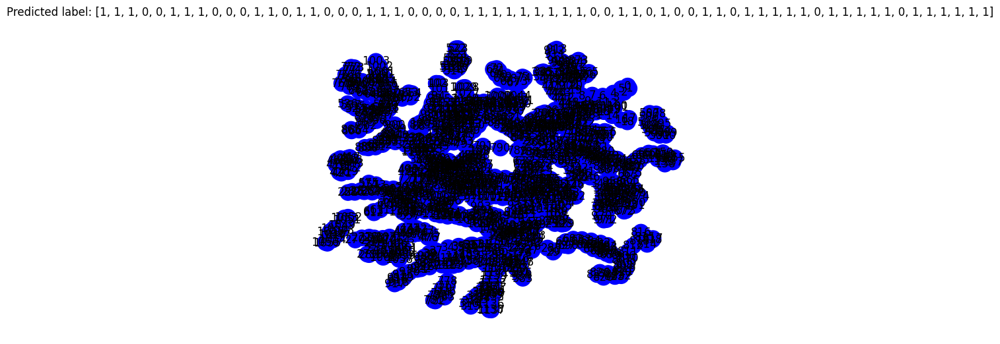

In [ ]:
# Import biblioteki PyTorch oraz klasy TUDataset z biblioteki torch_geometric.datasets
import torch
from torch_geometric.datasets import TUDataset

# Pobierz zbiór danych MUTAG z bazy TUDataset
dataset = TUDataset(root='data/TUDataset', name='MUTAG')

# Wyświetl informacje o zbiorze danych MUTAG
print()
print(f'Dataset: {dataset}:')
print('====================')
print(f'Number of graphs: {len(dataset)}') # Liczba grafów w zbiorze danych
print(f'Number of features: {dataset.num_features}') # Liczba cech w każdym grafie
print(f'Number of classes: {dataset.num_classes}') # Liczba klas, na które można podzielić grafy

# Pobierz pierwszy graf z dataset
data = dataset[0]

# Wyświetl informacje o pierwszym grafie
print()
print(data) # Wyświetl informacje o pierwszym grafie
print('=============================================================')

# Oblicz niektóre statystyki dla pierwszego grafu
print(f'Number of nodes: {data.num_nodes}') # Liczba węzłów w grafie
print(f'Number of edges: {data.num_edges}') # Liczba krawędzi w grafie
print(f'Average node degree: {data.num_edges / data.num_nodes:.2f}') # Średni stopień węzła
print(f'Has isolated nodes: {data.has_isolated_nodes()}') # Czy graf zawiera izolowane węzły?
print(f'Has self-loops: {data.has_self_loops()}') # Czy graf zawiera pętle?
print(f'Is undirected: {data.is_undirected()}') # Czy graf jest nieskierowany?

# Ustaw ziarno losowości dla biblioteki PyTorch
torch.manual_seed(12345)

# Przetasuj zbiór danych MUTAG
dataset = dataset.shuffle()

# Podziel zbiór danych na zbiór treningowy i testowy
train_dataset = dataset[:150]
test_dataset = dataset[150:]

# Wyświetl informacje o podziale zbioru danych
print(f'Number of training graphs: {len(train_dataset)}') # Liczba grafów w zbiorze treningowym
print(f'Number of test graphs: {len(test_dataset)}') # Liczba grafów w zbiorze testowym

# Załaduj dane z podzielonego zbioru danych do DataLoader
from torch_geometric.loader import DataLoader
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True) # DataLoader dla zbioru treningowego
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False) # DataLoader dla zbioru testowego

# Zdefiniuj model GCN
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.nn import global_mean_pool


class GCN(torch.nn.Module):
    def __init__(self, hidden_channels):
        super(GCN, self).__init__()
        torch.manual_seed(12345)
        self.conv1 = GCNConv(dataset.num_node_features, hidden_channels)  # pierwsza warstwa konwolucyjna
        self.conv2 = GCNConv(hidden_channels, hidden_channels)  # druga warstwa konwolucyjna
        self.conv3 = GCNConv(hidden_channels, hidden_channels)  # trzecia warstwa konwolucyjna
        self.conv4 = GCNConv(hidden_channels, hidden_channels)  # trzecia warstwa konwolucyjna
        self.conv5 = GCNConv(hidden_channels, hidden_channels)  # trzecia warstwa konwolucyjna
        self.lin = Linear(hidden_channels, dataset.num_classes)  # warstwa liniowa klasyfikatora

    def forward(self, x, edge_index, batch):
        # 1. Obliczenie osadzeń węzłów
        x = self.conv1(x, edge_index)
        x = x.relu()
        x = self.conv2(x, edge_index)
        x = x.relu()
        x = self.conv3(x, edge_index)
        x = x.relu()
        x = self.conv4(x, edge_index)
        x = x.relu()
        x = self.conv5(x, edge_index)

        # 2. Warstwa agregacji
        x = global_mean_pool(x, batch)  # [batch_size, hidden_channels]

        # 3. Zastosowanie klasyfikatora
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin(x)
        
        return x

model = GCN(hidden_channels=64)  # Tworzenie obiektu reprezentującego GCN o rozmiarze warstwy ukrytej 64
print(model)


model = GCN(hidden_channels=64)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Definicja optymalizatora Adam
criterion = torch.nn.CrossEntropyLoss()  # Definicja funkcji kosztu CrossEntropyLoss

def train():
    model.train()  # Ustawienie modelu w trybie treningowym

    for data in train_loader:  # Iteracja po danych treningowych w paczkach
         out = model(data.x, data.edge_index, data.batch)  # Wykonanie jednego przejścia sieci
         loss = criterion(out, data.y)  # Obliczenie funkcji kosztu
         loss.backward()  # Obliczenie gradientów
         optimizer.step()  # Aktualizacja parametrów na podstawie gradientów
         optimizer.zero_grad()  # Wyczyszczenie gradientów

def test(loader):
     model.eval()  # Ustawienie modelu w trybie testowym

     correct = 0
     for data in loader:  # Iteracja po danych testowych w paczkach
         out = model(data.x, data.edge_index, data.batch)  
         pred = out.argmax(dim=1)  # Użycie klasy z najwyższym prawdopodobieństwem
         correct += int((pred == data.y).sum())  # Sprawdzenie z etykietami prawdziwymi
     return correct / len(loader.dataset)  # Obliczenie wskaźnika poprawności predykcji


for epoch in range(1, 171):
    print(f"------------------------------ START {epoch}------------------------------")
    train()
    train_acc = test(train_loader)
    test_acc = test(test_loader)
    
    # Add visualization code here
    for data in train_loader:
        out = model(data.x, data.edge_index, data.batch)
        pred = out.argmax(dim=1)
        visualize_graph_classification(data, data.y.tolist(), pred.tolist())

    print(f'Epoch: {epoch:03d}, Train Acc: {train_acc:.4f}, Test Acc: {test_acc:.4f}')

    print(f"------------------------------ END {epoch}------------------------------")
